<div style="text-align: center; color: black;">
    <div style="font-size: 24px; font-weight: bold;">
    </div>
    <div style="font-size: 20px; font-weight: bold; margin-top: 10px;">
        Data Science Technical Test 🚀
    </div>
        <div>Name: Victor de Carvalho Silva</div>
        <div>Email: victorcarvsi@gmail.com</div>
        <div>Phone: +33 06 18 70 25 33</div>
        
  
</div>


Here is a brief summary of my approach:



- **Data Analysis:** <br>
The data analysis phase provided valuable initial insights into the behavior, distribution, and correlations among variables. Through this analysis, I identified potential issues and uncovered intriguing relationships between different variables. This foundational understanding set the stage for further refinements and enhancements. <br>
- **Data Cleaning:** <br>
In the data cleaning stage, I recategorized the gameType variable and removed data points that were problematic, highly correlated, or of little initial utility. Although I tested the removal of outliers, it did not result in significant improvements to the models or final outcomes.<br>
- **Feature Engineering:** <br>
For feature engineering, I categorized the data into quantitative and qualitative types, and applied techniques such as one-hot encoding and standard scaling. Despite testing PCA and creating new features, such as the total distance traveled by a player, these did not yield notable improvements in model performance.<br>
- **Modeling and Explainability:** <br>
During the modeling phase, I implemented a variety of models and metrics aligned with the project's objectives. I explored deep learning approaches, performed grid search for hyperparameter tuning, and evaluated the importance of features. This comprehensive approach aimed to ensure robust model performance and derive actionable insights for business applications.

While the methods applied have delivered strong results and align well with my approach, there are several additional techniques and refinements that could be explored to potentially enhance model performance further. Despite this, the current approach has already established a solid foundation and produced meaningful outcomes.

# Importing libraries and Datasets

#### Libraries

In [1]:
!pip install statsmodels > /dev/null


[notice] A new release of pip is available: 23.3.2 -> 24.2
[notice] To update, run: pip install --upgrade pip


In [2]:
pip install shap > /dev/null


[notice] A new release of pip is available: 23.3.2 -> 24.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install tensorflow > /dev/null


[notice] A new release of pip is available: 23.3.2 -> 24.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import csv
import shap
import tensorflow as tf
import xgboost as xgb

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.metrics import make_scorer, mean_squared_error, r2_score, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import Ridge, Lasso
from sklearn.svm import SVR
from sklearn.model_selection import cross_val_score, KFold
from statsmodels.stats.outliers_influence import variance_inflation_factor
from tensorflow.keras.layers import Input, Dense



pd.set_option('display.max_columns', None) #Show all columns

#### Datasets

Loading the Train set to check the data

In [2]:
# Load the CSV file of Train Set into a DataFrame
df_train = pd.read_csv('train.csv', delimiter=';')
df_train.head()

,playerId,teamId,gameId,assists,upgrades,damages,knocks,headshots,heals,killRank,killPts,kills,killStreaks,highestKill,gameTime,gameType,maxRank,numTeams,rankPts,revives,rideDist,roadKills,swimDist,teamKills,vehicleDestr,walkDist,weapons,winPts,winRankPercentage,date
0,81c344c888727b,dae978bd65143f,38d679593905a3,0,2,51.6,0,0,0,48,0,0,0,0.00,1432,duo-fpp,47,46,1536,0,966.4,0,1.992,0,0,2406.000,4,0,0.9130,2024-01-01 00:00:00.000000000
1,74dba8cecba6da,e44b5128e4f861,f4e9bc2d4b19b0,0,0,0.0,0,0,0,95,0,0,0,0.00,1421,duo-fpp,49,48,1749,0,0.0,0,0.000,0,0,4.006,1,0,0.0000,2024-01-01 00:03:25.636112722
2,2292771bba7753,7df55d0b0e1a86,a9fe25369da100,0,6,200.0,1,2,6,17,1404,2,1,35.97,1406,squad-fpp,28,26,-1,0,0.0,0,0.000,0,0,2399.000,5,1466,0.7778,2024-01-01 00:06:51.272225444
3,f25f61454087d2,16f35bd325cf84,c8f5ebd71810bb,2,1,140.0,0,0,1,69,0,0,0,0.00,1306,squad-fpp,28,28,1507,0,0.0,0,0.000,0,0,560.300,4,0,0.4444,2024-01-01 00:10:16.908338166
4,d25e7e90c00bd1,f9bdc97744ba53,c4da0c8dc58da6,0,0,0.0,0,0,0,64,1036,0,0,0.00,1333,duo-fpp,49,45,-1,0,0.0,0,0.000,0,0,22.990,0,1517,0.3958,2024-01-01 00:13:42.544450889


In [3]:
filtered_df = df_train[df_train['date'].str.contains('2024-04-15')]

sorted_df = filtered_df.sort_values(by=[ 'killRank'], ascending=[ False])
pd.set_option('display.max_rows', None)  
sorted_df.head()


,playerId,teamId,gameId,assists,upgrades,damages,knocks,headshots,heals,killRank,killPts,kills,killStreaks,highestKill,gameTime,gameType,maxRank,numTeams,rankPts,revives,rideDist,roadKills,swimDist,teamKills,vehicleDestr,walkDist,weapons,winPts,winRankPercentage,date
43766,4c1d7ecfdb75f5,1789198fe23645,46297a80db2f23,0,0,0.00,0,0,0,99,1000,0,0,0.0,1377,solo-fpp,100,96,-1,0,0.0,0,0.0,0,0,0.00,0,1500,0.0,2024-04-15 03:57:50.109402189
43827,1a923d9ff1cff2,727c92d6853ed7,1a5b85c7e2671a,0,0,43.00,0,0,0,99,0,0,0,0.0,1374,squad,28,27,1458,0,0.0,0,0.0,0,0,80.16,2,0,0.0,2024-04-15 07:26:53.912278246
44108,4a9e9b808bf40b,1e12e3108c08f4,824218f5791602,0,0,0.00,0,0,0,98,1002,0,0,0.0,1342,duo-fpp,49,49,0,0,0.0,0,0.0,0,0,19.53,1,1496,0.0,2024-04-15 23:29:57.659953200
43799,7bba838fcccdf3,f5d40a481e7863,7e9bd7d83e60a3,0,0,0.00,0,0,0,98,1502,0,0,0.0,1415,squad-fpp,29,28,-1,0,0.0,0,0.0,0,0,81.43,1,1507,0.0,2024-04-15 05:50:56.101122023
43863,c676f6f5d5bc89,57e39766a5aabd,f035a2e65d7f50,0,0,55.44,0,0,0,95,1215,0,0,0.0,1396,duo-fpp,48,47,0,0,0.0,0,0.0,0,0,18.71,1,1435,0.0,2024-04-15 09:30:16.812336248


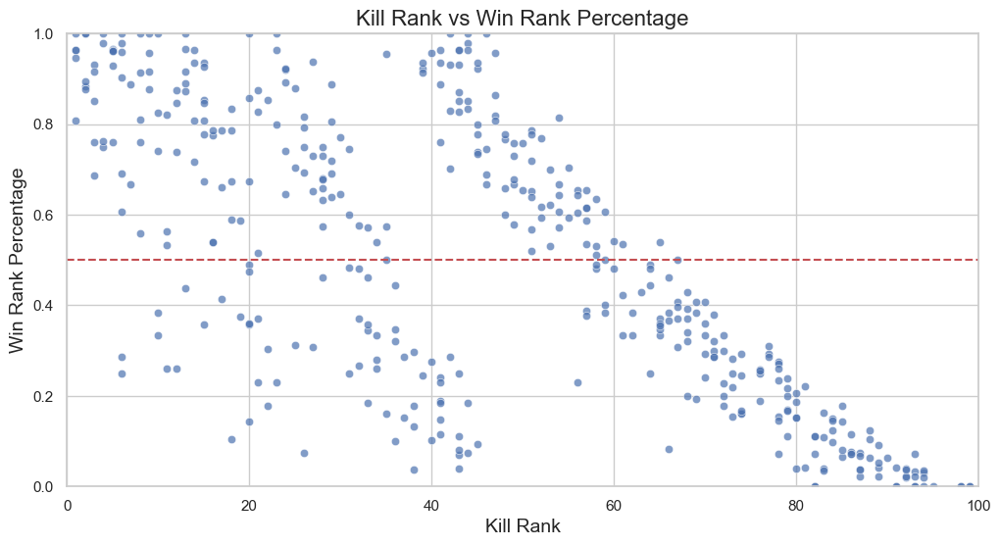

In [40]:
# Selecionando as colunas necessárias
selected_columns = filtered_df[['killRank', 'winRankPercentage']]

# Configurando o estilo do gráfico
sns.set(style="whitegrid")

# Criando o gráfico de dispersão
plt.figure(figsize=(12, 6))
sns.scatterplot(data=selected_columns, x='killRank', y='winRankPercentage', alpha=0.7)

# Adicionando título e rótulos aos eixos
plt.title('Kill Rank vs Win Rank Percentage', fontsize=16)
plt.xlabel('Kill Rank', fontsize=14)
plt.ylabel('Win Rank Percentage', fontsize=14)

# Exibindo o gráfico
plt.axhline(y=0.5, color='r', linestyle='--')  # Linha de referência no meio
plt.xlim(0, selected_columns['killRank'].max() + 1)  # Ajusta o limite do eixo x
plt.ylim(0, 1)  # O winRankPercentage está entre 0 e 1
plt.show()

Loading the Test set to check the data

In [625]:
# Checking the CSV file of Test Set into a DataFrame
df_test = pd.read_csv('test.csv', delimiter=';')
df_test.head()

,playerId,teamId,gameId,assists,upgrades,damages,knocks,headshots,heals,killRank,killPts,kills,killStreaks,highestKill,gameTime,gameType,maxRank,numTeams,rankPts,revives,rideDist,roadKills,swimDist,teamKills,vehicleDestr,walkDist,weapons,winPts,date
0,fdb7d0af46a788,897c68f1df2b33,35ab88ab7516ad,1,3,116.50,1,0,1,26,1000,1,1,24.13,1414,duo-fpp,49,47,-1,0,866.9,0,0.0,0,0,2222.0,5,1500,2024-05-01 00:00:00.000000000
1,cfa5a4ed838e8f,e7d1e2c433debe,e05f33046a739f,0,3,100.00,1,0,1,25,1402,1,1,78.33,1408,squad-fpp,29,29,-1,0,641.6,0,0.0,0,0,1619.0,6,1547,2024-05-01 00:08:38.503700740
2,cbec92e083ebcd,52ff12219a050c,ba14752a861c4d,0,2,0.00,0,0,0,44,1375,0,0,0.00,1261,squad-fpp,30,29,-1,0,0.0,0,167.7,0,0,3209.0,6,1655,2024-05-01 00:17:17.007401480
3,94514c935686ac,6718223e4d7dfa,42c9e8ca738110,0,0,33.37,0,0,0,44,0,0,0,0.00,1393,duo-fpp,48,46,1475,0,0.0,0,0.0,0,0,1670.0,7,0,2024-05-01 00:25:55.511102220
4,a05a6b38045f65,372d871d4e82b7,e196ff3b6f8ced,0,2,0.00,0,0,1,47,0,0,0,0.00,1966,squad-fpp,24,23,1324,0,2292.0,0,0.0,0,0,1837.0,3,0,2024-05-01 00:34:34.014802960


# Data Analysis

#### Getting the main info about the Train data

In [626]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 30 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   playerId           50000 non-null  object 
 1   teamId             50000 non-null  object 
 2   gameId             50000 non-null  object 
 3   assists            50000 non-null  int64  
 4   upgrades           50000 non-null  int64  
 5   damages            50000 non-null  float64
 6   knocks             50000 non-null  int64  
 7   headshots          50000 non-null  int64  
 8   heals              50000 non-null  int64  
 9   killRank           50000 non-null  int64  
 10  killPts            50000 non-null  int64  
 11  kills              50000 non-null  int64  
 12  killStreaks        50000 non-null  int64  
 13  highestKill        50000 non-null  float64
 14  gameTime           50000 non-null  int64  
 15  gameType           50000 non-null  object 
 16  maxRank            500

#### Checking the number of NAs on the Train dataset

In [627]:
na_counts = df_train.isna().sum()
print(na_counts)

playerId             0
teamId               0
gameId               0
assists              0
upgrades             0
damages              0
knocks               0
headshots            0
heals                0
killRank             0
killPts              0
kills                0
killStreaks          0
highestKill          0
gameTime             0
gameType             0
maxRank              0
numTeams             0
rankPts              0
revives              0
rideDist             0
roadKills            0
swimDist             0
teamKills            0
vehicleDestr         0
walkDist             0
weapons              0
winPts               0
winRankPercentage    0
date                 0
dtype: int64


#### Number of players per game and per team

In [628]:
# Calculate number of players per game
players_per_game = df_train.groupby('gameId').size()

# Calculate number of players per team
players_per_team = df_train.groupby('teamId').size()


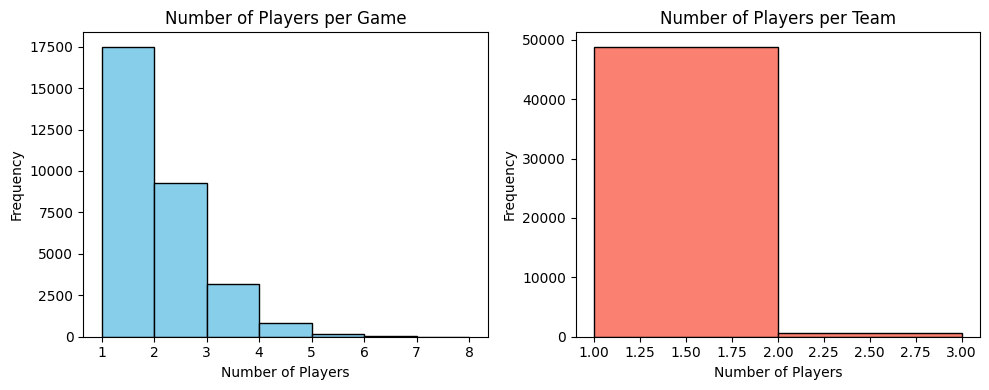

In [629]:
# Plot the number of players per game
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
players_per_game.plot(kind='hist', bins=range(1, players_per_game.max() + 1), color='skyblue', edgecolor='black')
plt.title('Number of Players per Game')
plt.xlabel('Number of Players')
plt.ylabel('Frequency')

# Plot the number of players per team
plt.subplot(1, 2, 2)
players_per_team.plot(kind='hist', bins=range(1, players_per_team.max() + 1), color='salmon', edgecolor='black')
plt.title('Number of Players per Team')
plt.xlabel('Number of Players')
plt.ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()


#### Correlation Matrix and PairPlot

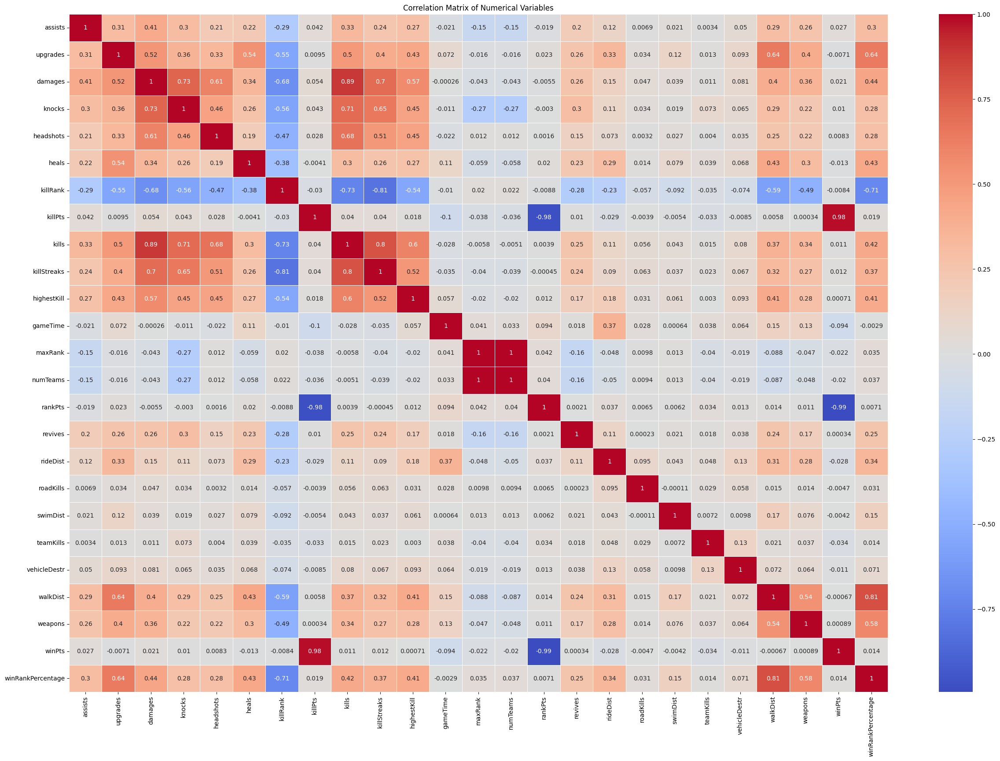

In [630]:
correlation_matrix = df_train.corr(numeric_only=True)

plt.figure(figsize=(30, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, linewidths=.5)

plt.title('Correlation Matrix of Numerical Variables')

plt.show()

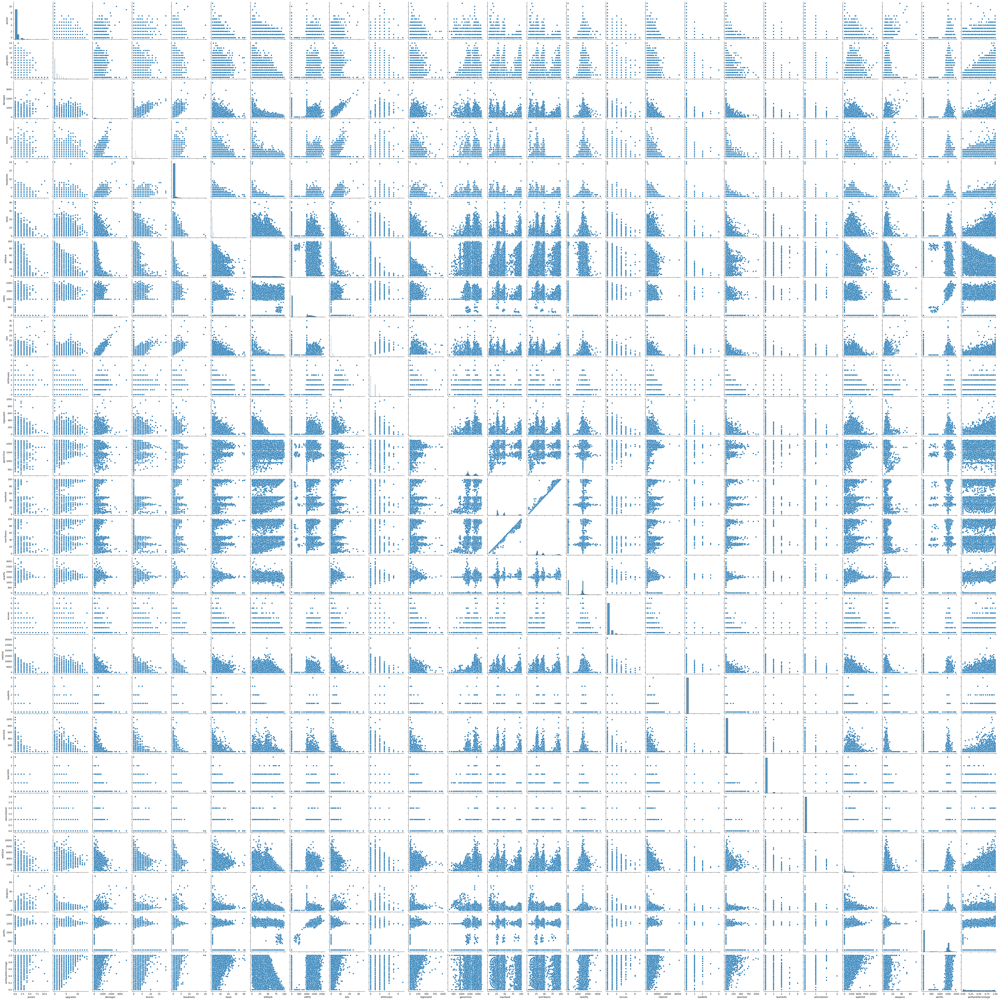

In [631]:
sns.pairplot(df_train)
plt.show()

**Conclusions:**

- `Damages` and `kills` (0.89): Very high correlation, showing a strong relationship between damage dealt and the number of eliminations. Players who deal more damage tend to have more kills.

- `Damages` and `knocks` (0.73): Strong positive correlation, suggesting that players who deal more damage also tend to knock down more enemies.

- `WinPts` and `killPts` (0.98): Extremely high correlation, indicating that victory points are almost perfectly correlated with kill points, which makes sense since a high number of kills generally contributes to a high victory score.

- Variables such as `rideDist`, `swimDist` and `teamKills` have very weak correlations with most other variables, indicating that these factors may not have a significant relationship with the central performance variables.

- The main reason why `killRank` has a negative correlation with most variables is that a higher killRank reflects worse performance in terms of kills, while most performance-related variables (such as kills, assists, damage, etc.) measure positive aspects of the game. When a player has a worse kill ranking, they tend to perform worse overall, which is reflected in lower numbers of assists, kills, damage dealt, and so on.

- High correlations may indicate that these variables are redundant or capturing similar information, which can cause multicollinearity in a regression model. This will also be tested with the VIF test.


#### Testing the multicolinearity

In [633]:
def calculate_vif(df_train):
    # Filter only numeric variables
    df_numeric = df_train.select_dtypes(include=[float, int])
    
    # Calculate VIF
    vif_data = pd.DataFrame()
    vif_data["feature"] = df_numeric.columns
    vif_data["VIF"] = [variance_inflation_factor(df_numeric.values, i) for i in range(df_numeric.shape[1])]
    
    return vif_data

vif_data = calculate_vif(df_train)
print(vif_data)


              feature          VIF
0             assists     1.506666
1            upgrades     3.372379
2             damages     9.513673
3              knocks     3.783502
4           headshots     2.158881
5               heals     1.872459
6            killRank    24.954413
7             killPts    53.317426
8               kills    11.083486
9         killStreaks     7.971104
10        highestKill     2.089214
11           gameTime    45.092723
12            maxRank  1120.404697
13           numTeams  1097.701473
14            rankPts    60.703632
15            revives     1.317941
16           rideDist     1.632911
17          roadKills     1.021883
18           swimDist     1.058039
19          teamKills     1.054595
20       vehicleDestr     1.053010
21           walkDist     7.190672
22            weapons     5.291394
23             winPts   100.961886
24  winRankPercentage    18.367337


**Conclusions:**

- `winPts` (100.96), `killPts` (53.32), `rankPts` (60.70), `maxRank` (1120.40), and `numTeams` (1097.70) have extremely high VIF values, indicating severe multicollinearity. These variables are likely highly correlated with other variables, which can lead to unstable coefficient estimates and affect the interpretability of the model.

- `damages` (9.51) and `kills` (11.08) have VIF values just above 10, indicating that they are also likely to be problematic in terms of multicollinearity.

#### Boxplots and Histograms

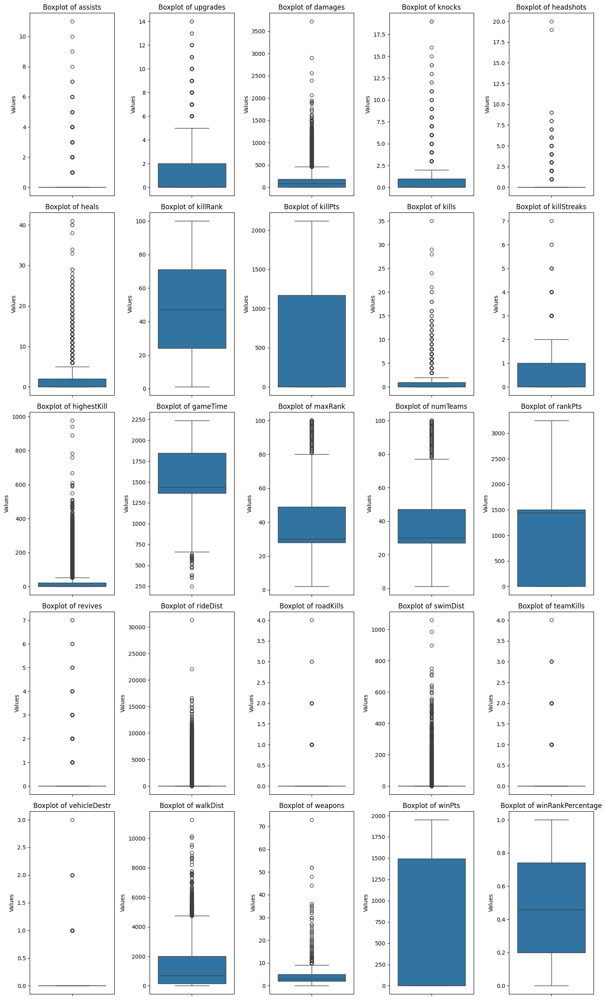

In [634]:
continuous_vars = df_train.select_dtypes(include=['number']).columns

num_vars = len(continuous_vars)
num_cols = 5  
num_rows = (num_vars + num_cols - 1) // num_cols 

# Create the figure and axes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
axes = axes.flatten()  # df_trainFlatten axes array for easy iteration

# Plot a boxplot for each quantitative variable
for i, var in enumerate(continuous_vars):
    sns.boxplot(data=df_train[var], ax=axes[i])
    axes[i].set_title(f'Boxplot of {var}')
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Values')

plt.tight_layout()
plt.show()

In [635]:
df_train.describe()

,assists,upgrades,damages,knocks,headshots,heals,killRank,killPts,kills,killStreaks,highestKill,gameTime,maxRank,numTeams,rankPts,revives,rideDist,roadKills,swimDist,teamKills,vehicleDestr,walkDist,weapons,winPts,winRankPercentage
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,0.231460,1.104860,130.002242,0.657060,0.225240,1.376980,47.576260,504.010320,0.921040,0.544160,22.845507,1578.265700,44.396660,42.899900,891.430180,0.165480,602.279772,0.003100,4.406022,0.023380,0.008220,1155.221535,3.664060,606.700880,0.472333
std,0.588535,1.712882,168.761176,1.126959,0.596216,2.706107,27.419194,625.913249,1.545177,0.711969,50.521006,259.234405,23.722093,23.189283,736.593524,0.467355,1492.832334,0.064579,28.966486,0.166114,0.094195,1183.298678,2.466172,739.525872,0.307449
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,246.000000,2.000000,1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,1367.000000,28.000000,27.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,155.375000,2.000000,0.000000,0.200000
50%,0.000000,0.000000,84.700000,0.000000,0.000000,0.000000,47.000000,0.000000,0.000000,0.000000,0.000000,1436.000000,30.000000,30.000000,1443.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,683.750000,3.000000,0.000000,0.457850
75%,0.000000,2.000000,184.300000,1.000000,0.000000,2.000000,71.000000,1169.000000,1.000000,1.000000,21.430000,1849.000000,49.000000,47.000000,1500.000000,0.000000,13.920000,0.000000,0.000000,0.000000,0.000000,1990.000000,5.000000,1495.000000,0.740700
max,11.000000,14.000000,3725.000000,19.000000,20.000000,41.000000,100.000000,2120.000000,35.000000,7.000000,977.100000,2237.000000,100.000000,100.000000,3248.000000,7.000000,31290.000000,4.000000,1060.000000,4.000000,3.000000,11260.000000,73.000000,1953.000000,1.000000


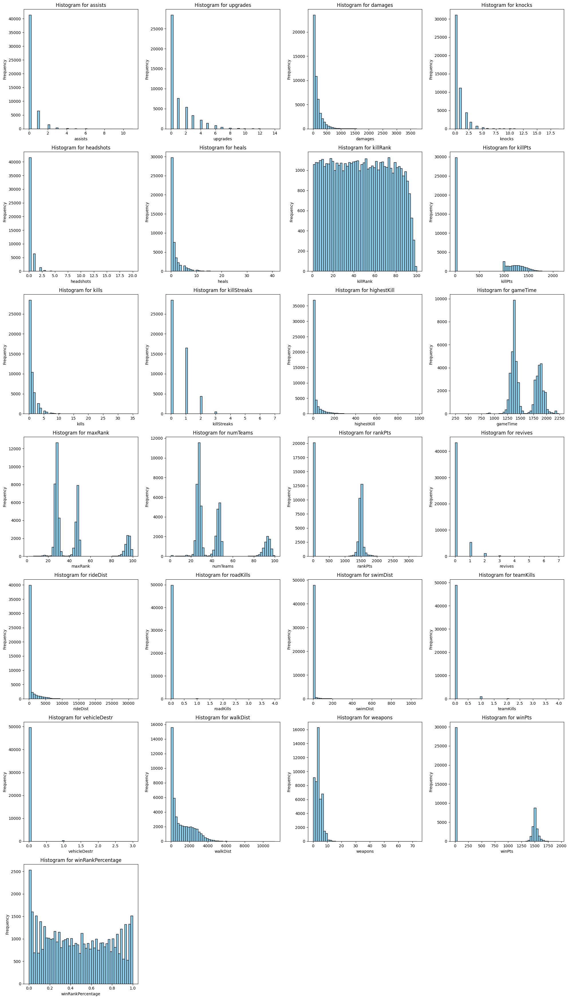

In [636]:
numeric_columns = df_train.select_dtypes(include=[np.number]).columns

# Number of columns to display
num_cols = len(numeric_columns)
num_rows = (num_cols + 3) // 4  # Calculate the number of rows needed for 4 columns per row

# Set up the layout of the plots
fig, axs = plt.subplots(num_rows, 4, figsize=(20, num_rows * 5))

# Plot histograms
for i, col in enumerate(numeric_columns):
    row, col_pos = divmod(i, 4)
    
    axs[row, col_pos].hist(df_train[col], bins=50, color='skyblue', edgecolor='black')
    axs[row, col_pos].set_title(f'Histogram for {col}')
    axs[row, col_pos].set_xlabel(col)
    axs[row, col_pos].set_ylabel('Frequency')

# Remove any empty subplots
if num_cols % 4 != 0:
    for j in range(num_cols % 4, 4):
        fig.delaxes(axs[-1, j])

# Adjust layout
plt.tight_layout()
plt.show()

**Conclusions:**

- The quantitative variables show a wide range of values, with some variables (such as `kills`, `damages`, and `killPts`) exhibiting high variability and extreme values. Other variables, like `assists` and `headshots`, have a more concentrated distribution around lower values.

- Most players have low performance. Many variables like `kills`, `assists`, and `knocks` have mean and median values close to zero, indicating that most players perform few offensive actions per match.

- Performance varies significantly between players. Variables such as `damages` and `walkDist` show high variability, suggesting that players' styles and performance differ widely.

- The values for `kills`, `assists`, and other variables are highly concentrated in lower ranges, with only a few players achieving significantly above-average results.
  
- `KillRank` is inversely related to performance: A higher KillRank is associated with fewer kills, assists, and other performance metrics, reflecting worse outcomes.

OUTLIERS?

- Variables with large differences between the maximum and the 75th percentile, and those with high standard deviations, are strong candidates for having outliers. The presence of outliers can influence statistical modeling and should be considered when building and evaluating predictive models.

- According to my initial assessment, the outliers do not represent errors in the data but rather interesting behavioral observations to be retained. I will subsequently use the StandardScaler to mitigate (but not directly treat) the impact of the outliers and also employ models that are less affected by their presence. Other approaches, such as normalization, clustering, and even removal, could be applied.

# Data Cleaning

#### Treating the `gameType` Column

Here, I chose to follow the variable description by creating an 'other' group and obtaining fewer distinct classes:

"gameType - String identifying the game type. The classic modes are “solo”, “duo”, “squad”, “solo-fpp”,
“duo-fpp”, and “squad-fpp”. <br>
Others are from events or custom matches.

In [637]:
game_type_counts = df_train['gameType'].value_counts()
game_type_counts

gameType
squad-fpp           19767
duo-fpp             11310
squad                6999
solo-fpp             5934
duo                  3518
solo                 2039
normal-squad-fpp      220
crashfpp               74
normal-duo-fpp         68
flaretpp               30
normal-solo-fpp        15
normal-squad            9
flarefpp                8
crashtpp                6
normal-solo             2
normal-duo              1
Name: count, dtype: int64

In [638]:
# Frequency of each category
game_type_counts = df_train['gameType'].value_counts()

# Define the main categories and group the others as 'Other'
main_categories = ['squad-fpp', 'duo-fpp', 'squad', 'solo-fpp', 'duo', 'solo']

# Function to map categories
def map_game_type(game_type):
    if game_type in main_categories:
        return game_type
    else:
        return 'other'

# Apply the mapping function
df_train['gameTypeMapped'] = df_train['gameType'].apply(map_game_type)

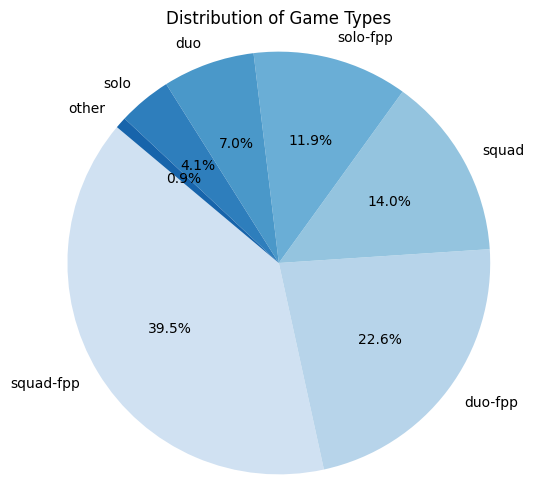

In [639]:
# Frequency of each category after mapping
game_type_counts_mapped = df_train['gameTypeMapped'].value_counts()

# Create a color scale of blue and gray
num_colors = len(game_type_counts_mapped)
blues = plt.cm.Blues(np.linspace(0.2, 0.8, num_colors))
grays = plt.cm.Greys(np.linspace(0.4, 0.8, num_colors))
colors = np.vstack((blues, grays))  # Combine blue and gray scales
colors = colors[:num_colors]  # Adjust the number of colors

# Create the pie chart
plt.figure(figsize=(6, 6))
plt.pie(game_type_counts_mapped, labels=game_type_counts_mapped.index, autopct='%1.1f%%', colors=colors, startangle=140)
plt.title('Distribution of Game Types')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Show the chart
plt.show()

**Conclusions:**

- The distribution of the  `gameTypeMapped` variable shows varying frequencies across different game types. The most frequent category is squad-fpp with 19,767 instances, while the least frequent is other with only 433 instances. This disparity in class sizes highlights a potential issue of class imbalance.

- Balancing classes is often crucial in machine learning tasks, particularly when the model is sensitive to class distribution. 
However, at this initial stage, I have chosen not to balance the classes. This decision is based on the intention to use models that are relatively insensitive to class imbalance. By observing how these models perform without class balancing, I aim to understand their behavior and evaluate whether the imbalance significantly impacts their effectiveness. If necessary, balancing techniques can be applied later based on the performance results and model requirements.

#### Removing columns

At this initial stage, I opted to remove variables `maxRank` and `numTeams` and observe the behavior of the models, as they exhibit high VIF and low correlation with the response variable (`winRankPercentage`). `vehicleDestr`, `teamKills`, `roadKills` were removed because they have high concentration on value = 0 and have poor correlation with the responde variable.  I also removed columns like `playerId`, `teamId`, `gameId`, `date`, `gameType`, since they are not relevant for my initial approach.

In [640]:
# Excluding columns that are not necessary for the initial analysis
columns_to_drop = ['playerId', 'teamId', 'gameId', 'date', 'gameType','maxRank', 'numTeams', 'vehicleDestr', 'teamKills', 'roadKills' ] 
df_train.drop(columns=columns_to_drop, inplace=True)
df_train.head()

,assists,upgrades,damages,knocks,headshots,heals,killRank,killPts,kills,killStreaks,highestKill,gameTime,rankPts,revives,rideDist,swimDist,walkDist,weapons,winPts,winRankPercentage,gameTypeMapped
0,0,2,51.6,0,0,0,48,0,0,0,0.00,1432,1536,0,966.4,1.992,2406.000,4,0,0.9130,duo-fpp
1,0,0,0.0,0,0,0,95,0,0,0,0.00,1421,1749,0,0.0,0.000,4.006,1,0,0.0000,duo-fpp
2,0,6,200.0,1,2,6,17,1404,2,1,35.97,1406,-1,0,0.0,0.000,2399.000,5,1466,0.7778,squad-fpp
3,2,1,140.0,0,0,1,69,0,0,0,0.00,1306,1507,0,0.0,0.000,560.300,4,0,0.4444,squad-fpp
4,0,0,0.0,0,0,0,64,1036,0,0,0.00,1333,-1,0,0.0,0.000,22.990,0,1517,0.3958,duo-fpp


#### Treating related variables

Here, I chose to handle the variables according to the information received.

- Treating the 0 in KillPts:

`killPts` - Kills-based external ranking of player. (Kind of Elo ranking where only kills matter.) 
If there is a value other than -1 in `rankPts`, then any 0 in `killPts` should be treated as a “None”. 

In [641]:
df_train.loc[df_train['rankPts'] != -1, 'killPts'] = df_train.loc[df_train['rankPts'] != -1, 'killPts'].replace(0, np.nan)

- Treating the -1 in rankPts:


`rankPts` - Elo-like ranking of player. This ranking is inconsistent and is being deprecated so use with  caution. Value of -1 takes place of “None”. 

In [642]:
df_train['rankPts'] = df_train['rankPts'].replace(-1, np.nan)

- Treating 0 in winPts:

`winPts` - Win-based external ranking of player. (Kind of Elo ranking where only winning matters.) If there is  a value other than -1 in `rankPts`, then any 0 in `winPts` should be treated as a “None”. ∙

In [643]:
df_train['winPts'] = df_train.apply(lambda row: np.nan if row['rankPts'] != -1 and row['winPts'] == 0 else row['winPts'], axis=1)

Checking the NAs after the treatments

In [644]:
na_counts = df_train.isna().sum()
na_counts

assists                  0
upgrades                 0
damages                  0
knocks                   0
headshots                0
heals                    0
killRank                 0
killPts              29840
kills                    0
killStreaks              0
highestKill              0
gameTime                 0
rankPts              19191
revives                  0
rideDist                 0
swimDist                 0
walkDist                 0
weapons                  0
winPts               29840
winRankPercentage        0
gameTypeMapped           0
dtype: int64

After the transformations, I observed a large number of NAs for variables `winPts`, `rankPts`, and `killPts`. Since they were described as problematic, have almost no significative correlation with the response variable, and now show a significant amount of NAs, I initially chose to remove them.

In [645]:
columns_to_drop = ['killPts', 'rankPts', 'winPts'] 
df_train.drop(columns=columns_to_drop, inplace=True)

# Feature Engineering

#### Continuous and categorial variables

Here, I started by creating two lists with the continuous and categorical variables of the dataset. <br>
Note that I am not including `winRankPercentage` in both lists since I shouldn't apply data preprocessing to it

In [646]:
# List of continuous variables
continuous_vars = list(df_train.select_dtypes(include=[int, float]).columns)
continuous_vars.remove("winRankPercentage")

# List of categorical variables
categorical_vars = list(df_train.select_dtypes(include=["object"]).columns)

In [647]:
print(continuous_vars)
print(categorical_vars)

['assists', 'upgrades', 'damages', 'knocks', 'headshots', 'heals', 'killRank', 'kills', 'killStreaks', 'highestKill', 'gameTime', 'revives', 'rideDist', 'swimDist', 'walkDist', 'weapons']
['gameTypeMapped']


#### Train an Validation Sets

Given that the test set does not include the response variable, I decided to split the training dataset into training and validation subsets. This approach allows me to evaluate the model's performance during the training phase and adjust the model parameters accordingly. By using the validation set, I can ensure that the model is properly tuned and generalizes well before making predictions on the test set, which is reserved solely for final evaluation.

In [648]:
X = df_train.drop('winRankPercentage', axis=1)
y = df_train['winRankPercentage']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)


#### One hot encoding 

One-hot encoding is a preprocessing technique used to convert categorical variables into a numerical format that machine learning algorithms can process. It creates binary columns for each unique category. It should be applied because my dataset includes a categorical variable that needs to be transformed into numerical data for models that do not handle categorical variables well, such as linear regression, SVM, and neural networks.

In [649]:
# Initialize the encoder
encoder = OneHotEncoder(sparse_output=False, drop='first')

# Fit the encoder and transform the training set
X_train_cat = encoder.fit_transform(X_train[categorical_vars])
X_val_cat = encoder.transform(X_val[categorical_vars])

# Create DataFrames with the correct column names for training and validation
X_train_cat_df = pd.DataFrame(X_train_cat, columns=encoder.get_feature_names_out(categorical_vars))
X_val_cat_df = pd.DataFrame(X_val_cat, columns=encoder.get_feature_names_out(categorical_vars))

# Reset indices to facilitate concatenation
X_train_cat_df.reset_index(drop=True, inplace=True)
X_val_cat_df.reset_index(drop=True, inplace=True)

# Remove the original categorical variables
X_train = X_train.drop(categorical_vars, axis=1).reset_index(drop=True)
X_val = X_val.drop(categorical_vars, axis=1).reset_index(drop=True)

# Concatenate the encoded columns back to the original DataFrame
X_train = pd.concat([X_train, X_train_cat_df], axis=1)
X_val = pd.concat([X_val, X_val_cat_df], axis=1)


#### StandardScaler

StandardScaler is a preprocessing technique used to standardize features by removing the mean and scaling to unit variance. This transforms the data into a distribution with a mean of 0 and a standard deviation of 1. It should be applied when features have different scales, as it ensures that each feature contributes equally to the model, preventing features with larger scales from dominating. This is particularly important for algorithms sensitive to feature scaling, such as gradient descent-based models and SVM.

In [650]:
# Scale the continuous variables
scaler = StandardScaler()

X_train_cont_scaled = scaler.fit_transform(X_train[continuous_vars])
X_val_cont_scaled = scaler.transform(X_val[continuous_vars])

X_train_cont_df = pd.DataFrame(X_train_cont_scaled, columns=continuous_vars)
X_val_cont_df = pd.DataFrame(X_val_cont_scaled, columns=continuous_vars)

X_train_cont_df.reset_index(drop=True, inplace=True)
X_val_cont_df.reset_index(drop=True, inplace=True)

# Remove the original continuous variables and concatenate the scaled data
X_train = X_train.drop(continuous_vars, axis=1).reset_index(drop=True)
X_val = X_val.drop(continuous_vars, axis=1).reset_index(drop=True)

X_train = pd.concat([X_train, X_train_cont_df], axis=1)
X_val = pd.concat([X_val, X_val_cont_df], axis=1)


### Adjusting the Test Set with the same procedures as the Train Set

Here, I am applying the same type of preprocessing to the test set as I did to the training set, so that it is properly evaluated by my models.

#### Treating the `gameType` variable

In [662]:
# Frequency of each category
game_type_counts = df_test['gameType'].value_counts()

# Define the main categories and group the others as 'Other'
main_categories = ['squad-fpp', 'duo-fpp', 'squad', 'solo-fpp', 'duo', 'solo']

# Function to map categories
def map_game_type(game_type):
    if game_type in main_categories:
        return game_type
    else:
        return 'other'

# Apply the mapping function
df_test['gameTypeMapped'] = df_test['gameType'].apply(map_game_type)

#### Removing the same columns

In [663]:
columns_to_drop = ['maxRank', 'numTeams','playerId', 'teamId', 'gameId', 'date', 'gameType','killPts', 'rankPts', 'winPts', 'vehicleDestr', 'teamKills', 'roadKills' ] 
df_test.drop(columns=columns_to_drop, inplace=True)

#### One-hot encoding

In [664]:
# Apply One-Hot Encoding to the test data
X_test_cat = encoder.transform(df_test[categorical_vars])
X_test_cat_df = pd.DataFrame(X_test_cat, columns=encoder.get_feature_names_out(categorical_vars))

# Reset index for easier concatenation
X_test_cat_df.reset_index(drop=True, inplace=True)

# Remove original categorical variables from the test data
X_test = df_test.drop(categorical_vars, axis=1).reset_index(drop=True)

# Concatenate the encoded columns back to the test DataFrame
X_test = pd.concat([X_test, X_test_cat_df], axis=1)

#### StandardScaler

In [665]:
# Apply Standard Scaling to the test data
X_test_cont_scaled = scaler.transform(X_test[continuous_vars])
X_test_cont_df = pd.DataFrame(X_test_cont_scaled, columns=continuous_vars)

# Reset index for easier concatenation
X_test_cont_df.reset_index(drop=True, inplace=True)

# Remove original continuous variables and concatenate the scaled data
X_test = X_test.drop(continuous_vars, axis=1).reset_index(drop=True)
X_test = pd.concat([X_test, X_test_cont_df], axis=1)

In [666]:
X_test.head()

,gameTypeMapped_duo-fpp,gameTypeMapped_other,gameTypeMapped_solo,gameTypeMapped_solo-fpp,gameTypeMapped_squad,gameTypeMapped_squad-fpp,assists,upgrades,damages,knocks,headshots,heals,killRank,kills,killStreaks,highestKill,gameTime,revives,rideDist,swimDist,walkDist,weapons
0,1.0,0.0,0.0,0.0,0.0,0.0,1.298804,1.103317,-0.078601,0.305884,-0.380484,-0.139175,-0.788028,0.051252,0.641792,0.025758,-0.632352,-0.35636,0.176697,-0.154157,0.902140,0.537828
1,0.0,0.0,0.0,0.0,0.0,1.0,-0.389654,1.103317,-0.176331,0.305884,-0.380484,-0.139175,-0.824564,0.051252,0.641792,1.103304,-0.655524,-0.35636,0.025499,-0.154157,0.391993,0.941800
2,0.0,0.0,0.0,0.0,0.0,1.0,-0.389654,0.520030,-0.768633,-0.584024,-0.380484,-0.506124,-0.130374,-0.595257,-0.764721,-0.453969,-1.223242,-0.35636,-0.405077,5.752394,1.737157,0.941800
3,1.0,0.0,0.0,0.0,0.0,0.0,-0.389654,-0.646545,-0.570982,-0.584024,-0.380484,-0.506124,-0.130374,-0.595257,-0.764721,-0.453969,-0.713454,-0.35636,-0.405077,-0.154157,0.435140,1.345771
4,0.0,0.0,0.0,0.0,0.0,1.0,-0.389654,0.520030,-0.768633,-0.584024,-0.380484,-0.139175,-0.020765,-0.595257,-0.764721,-0.453969,1.499487,-0.35636,1.133078,-0.154157,0.576424,-0.270116


Checking the column names, since they must be the same

In [608]:
print(f"Training columns after encoding: {X_train.columns.tolist()}")
print(f"Test columns after encoding: {X_test.columns.tolist()}")

Training columns after encoding: ['gameTypeMapped_duo-fpp', 'gameTypeMapped_other', 'gameTypeMapped_solo', 'gameTypeMapped_solo-fpp', 'gameTypeMapped_squad', 'gameTypeMapped_squad-fpp', 'assists', 'upgrades', 'damages', 'knocks', 'headshots', 'heals', 'killRank', 'kills', 'killStreaks', 'highestKill', 'gameTime', 'revives', 'rideDist', 'swimDist', 'walkDist', 'weapons']
Test columns after encoding: ['gameTypeMapped_duo-fpp', 'gameTypeMapped_other', 'gameTypeMapped_solo', 'gameTypeMapped_solo-fpp', 'gameTypeMapped_squad', 'gameTypeMapped_squad-fpp', 'assists', 'upgrades', 'damages', 'knocks', 'headshots', 'heals', 'killRank', 'kills', 'killStreaks', 'highestKill', 'gameTime', 'revives', 'rideDist', 'swimDist', 'walkDist', 'weapons']


# Modeling

#### Random Forest, Ridge Regression, Lasso Regression, Gradient Boosting, XGBoost e Support Vector Regression.

**Why these models ?**

The choice of models in my analysis encompasses a variety of techniques suited to different aspects of regression tasks. The code sets up a list of regression models to be evaluated, including Random Forest, Ridge Regression, Lasso Regression, Gradient Boosting, XGBoost, and Support Vector Regression (SVR). By evaluating these diverse models, I ensure that my approach is robust, adaptable to different types of relationships in the data, and capable of providing accurate predictions and insights.

**Model Evaluation/ Metrics:**
  
* RMSE: Measures the average magnitude of the errors between predicted and actual values. Lower RMSE indicates better model performance.<br>
* MAE (Mean Absolute Error): Represents the average of the absolute differences between predicted and actual values. It gives a straightforward interpretation of error magnitude, where lower MAE reflects a more accurate model.
* R² Score: Represents the proportion of variance explained by the model. Higher R² suggests a better fit.<br>
* Cross-Validation: Provides a more reliable estimate of model performance by evaluating it on multiple subsets of the training data. This helps to assess the model's generalizability and avoid overfitting.


In [654]:
# Define the training and evaluation function
def train_and_evaluate(model, X_train, y_train, X_val, y_val, model_name):
    model.fit(X_train, y_train)
    
    y_train_pred = model.predict(X_train)
    y_val_pred = model.predict(X_val)
    
    # Calculate metrics
    train_rmse = mean_squared_error(y_train, y_train_pred, squared=False)
    train_mae = mean_absolute_error(y_train, y_train_pred)
    train_r2 = r2_score(y_train, y_train_pred)
    
    val_rmse = mean_squared_error(y_val, y_val_pred, squared=False)
    val_mae = mean_absolute_error(y_val, y_val_pred)
    val_r2 = r2_score(y_val, y_val_pred)
    
    # Cross-validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cross_val_r2 = cross_val_score(model, X_train, y_train, cv=kf, scoring='r2')
    
    return {
        'Model': model_name,
        'Train RMSE': train_rmse,
        'Train MAE': train_mae,
        'Train R²': train_r2,
        'Validation RMSE': val_rmse,
        'Validation MAE': val_mae,
        'Validation R²': val_r2,
        'Cross-Validated R² Mean': np.mean(cross_val_r2),
        'Cross-Validated R² Std': np.std(cross_val_r2)
    }

# Models and parameters
models = [
    (RandomForestRegressor(n_estimators=100, max_depth=10, min_samples_leaf=5, min_samples_split=10), 'Random Forest'),
    (Ridge(alpha=1.0), 'Ridge Regression'),
    (Lasso(alpha=0.1), 'Lasso Regression'),
    (GradientBoostingRegressor(n_estimators=100), 'Gradient Boosting'),
    (xgb.XGBRegressor(n_estimators=100), 'XGBoost'),
    (SVR(kernel='rbf', C=1.0, epsilon=0.1), 'Support Vector Regression')
]

# Train and evaluate the models
results = []
for model, name in models:
    result = train_and_evaluate(model, X_train, y_train, X_val, y_val, name)
    results.append(result)

# Create a DataFrame from the results
results_df = pd.DataFrame(results)


In [655]:
results_df

,Model,Train RMSE,Train MAE,Train R²,Validation RMSE,Validation MAE,Validation R²,Cross-Validated R² Mean,Cross-Validated R² Std
0,Random Forest,0.090807,0.064633,0.912472,0.098706,0.069943,0.898279,0.893623,0.002700
1,Ridge Regression,0.127119,0.092702,0.828474,0.128698,0.092854,0.827073,0.828162,0.003127
2,Lasso Regression,0.191602,0.161135,0.610316,0.192990,0.163052,0.611140,0.610284,0.002554
3,Gradient Boosting,0.100240,0.071372,0.893342,0.100837,0.071669,0.893840,0.889693,0.002967
4,XGBoost,0.074319,0.054554,0.941372,0.092353,0.065519,0.910951,0.906473,0.001160
5,Support Vector Regression,0.088496,0.064930,0.916871,0.097760,0.069728,0.900220,0.895265,0.002282


**Conclusions:**

- Comparing training and validation metrics helps in assessing overfitting. Significant differences between training and validation performance may indicate that the model is too complex and is overfitting the training data. Consistent performance across training and validation sets suggests a model that generalizes well. <br>

- **Random Forest and Support Vector Regression** show excellent performance in both Train RMSE and Train R², indicating that these models fit the training data very well. The small difference between Train RMSE and Validation RMSE for these models suggests that overfitting is not a major concern here.<br>

- **Lasso Regression and Ridge Regression** have relatively modest performance on both training and validation, with Lasso Regression being the least precise. This suggests that these models are not overfitting and may be generalizing well, but with lower accuracy compared to ensemble and boosting models.<br>

- **XGBoost** shows the lowest Validation RMSE and the highest Validation R² among all models, indicating excellent generalization capability. Additionally, it has the highest Cross-Validated R² Mean and the lowest Cross-Validated R² Std, suggesting that XGBoost performs well in cross-validation and is consistent.<br>
  
- **Gradient Boosting and Random Forest** also have good validation and cross-validation metrics, indicating they generalize well to new data, but not as effectively as XGBoost.<br>

- **Random Forest, Gradient Boosting, and XGBoost** are more complex methods and may require more processing time and computational resources compared to linear methods like Ridge and Lasso. While XGBoost offers efficiency, it can be more computationally intensive, especially with large datasets.<br>

**Best Model:**

- Based on the provided metrics, I would recommend **XGBoost** as the best model. It has the lowest Validation RMSE and the highest Validation R², along with a high Cross-Validated R² Mean and a low standard deviation. This suggests that XGBoost not only performs exceptionally well but is also robust and consistent across different cross-validation datasets.<br>
  
- If computational efficiency is a major concern and processing time is critical, I might consider Gradient Boosting or Random Forest as alternatives. They also show good metrics and may be less demanding than XGBoost.<br>

#### Deep Learning: Neural Networks

In this analysis, I applied a deep learning model, specifically a neural network, to take advantage of its ability to capture complex patterns and interactions in the data. Neural networks can learn intricate relationships that traditional models might miss, leading to improved predictive accuracy. By comparing the performance of the neural network with other models, I validate their effectiveness and gain insights into how advanced techniques can enhance our predictions. This approach helps ensure that I select the most robust and accurate model for the data.

In [656]:
# Define the Neural Network model
model = tf.keras.Sequential([
    Input(shape=(X_train.shape[1],)),  # Define the input layer with the number of features in X_train
    Dense(64, activation='relu'),      # First dense layer with 64 neurons and ReLU activation
    Dense(32, activation='relu'),      # Second dense layer with 32 neurons and ReLU activation
    Dense(1)                           # Output layer with 1 neuron for regression
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0, validation_data=(X_val, y_val))

# Make predictions for training and validation
y_train_pred_nn = model.predict(X_train).flatten()  # Flatten the array to match the expected shape
y_val_pred_nn = model.predict(X_val).flatten()

# Calculate metrics for training
train_rmse_nn = mean_squared_error(y_train, y_train_pred_nn, squared=False)
train_r2_nn = r2_score(y_train, y_train_pred_nn)

# Calculate metrics for validation
val_rmse_nn = mean_squared_error(y_val, y_val_pred_nn, squared=False)
val_r2_nn = r2_score(y_val, y_val_pred_nn)

# Display the metrics
print(f'Neural Network')
print(f'Train RMSE: {train_rmse_nn}')
print(f'Train R²: {train_r2_nn}')
print(f'Validation RMSE: {val_rmse_nn}')
print(f'Validation R²: {val_r2_nn}')


1250/1250 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 240us/step
Neural Network
Train RMSE: 0.0856984749223302
Train R²: 0.922042516024841
Validation RMSE: 0.09413568298039338
Validation R²: 0.9074810033904805


**Conclusions:**

In summary, the neural network demonstrates superior performance in both training and validation phases compared to other models. Its ability to handle complex data structures and relationships makes it a strong candidate for achieving the best predictive accuracy, thereby validating and enhancing the overall model selection process. 

On the other hand, while the neural network offers excellent predictive performance, it comes with trade-offs in terms of computational demands, complexity, and the need for careful tuning and validation to ensure that it does not overfit.

The extent of overfitting appears moderate based on the provided metrics. Further validation and testing on unseen data are recommended to fully assess the model's generalization ability.

#### Grid Search

Grid Search is essential for optimizing machine learning models by exploring different hyperparameter combinations to improve performance. I chose to apply Grid Search to the XGBoost model because of its strong performance in initial tests. By fine-tuning hyperparameters like learning rate and tree depth, Grid Search helps maximize XGBoost’s predictive accuracy, enhancing the model's effectiveness.

In [657]:
# Define the parameter grid for XGBoost
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 6, 9],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9],
    'colsample_bytree': [0.8, 0.9]
}

# Initialize the XGBoost model
xgb_model = xgb.XGBRegressor()

# Define custom scoring metrics
scoring = {
    'r2': 'r2',
    'rmse': make_scorer(mean_squared_error, squared=False),
    'mae': make_scorer(mean_absolute_error)  
}

# Initialize GridSearchCV
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring=scoring,
    cv=5,  # 5-fold cross-validation
    refit='r2',  # Refit the best model on the whole dataset using the 'r2' metric
    verbose=1,
    n_jobs=-1  # Use all available cores
)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Get the best model and parameters
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_

# Predict and evaluate the best model
y_train_pred_best = best_model.predict(X_train)
y_val_pred_best = best_model.predict(X_val)

# Calculate metrics
train_rmse_best = mean_squared_error(y_train, y_train_pred_best, squared=False)
train_mae_best = mean_absolute_error(y_train, y_train_pred_best)
train_r2_best = r2_score(y_train, y_train_pred_best)

val_rmse_best = mean_squared_error(y_val, y_val_pred_best, squared=False)
val_mae_best = mean_absolute_error(y_val, y_val_pred_best)
val_r2_best = r2_score(y_val, y_val_pred_best)

# Print the best parameters and metrics
print(f'Best Parameters: {best_params}')
print(f'Best Train RMSE: {train_rmse_best}')
print(f'Best Train MAE: {train_mae_best}')
print(f'Best Train R²: {train_r2_best}')
print(f'Best Validation RMSE: {val_rmse_best}')
print(f'Best Validation MAE: {val_mae_best}')
print(f'Best Validation R²: {val_r2_best}')


Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best Parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 200, 'subsample': 0.9}
Best Train RMSE: 0.077639849029085
Best Train MAE: 0.056989663737546575
Best Train R²: 0.9360145848808603
Best Validation RMSE: 0.09083399867773802
Best Validation MAE: 0.06457218460095772
Best Validation R²: 0.9138571523194263


#### Best MODEL

In [660]:
# Define the best parameters
best_params = {
    'colsample_bytree': 0.8,
    'learning_rate': 0.1,
    'max_depth': 6,
    'n_estimators': 200,
    'subsample': 0.9
}

# Initialize the XGBoost model with the best parameters
xgb_model = xgb.XGBRegressor(
    colsample_bytree=best_params['colsample_bytree'],
    learning_rate=best_params['learning_rate'],
    max_depth=best_params['max_depth'],
    n_estimators=best_params['n_estimators'],
    subsample=best_params['subsample']
)

# Fit the model on the training data
xgb_model.fit(X_train, y_train)

# Predict and evaluate the model on the training set
y_train_pred_best = xgb_model.predict(X_train)

# Predict and evaluate the model on the validation set
y_val_pred_best = xgb_model.predict(X_val)

# Calculate metrics for training data
train_rmse_best = mean_squared_error(y_train, y_train_pred_best, squared=False)
train_mae_best = mean_absolute_error(y_train, y_train_pred_best)
train_r2_best = r2_score(y_train, y_train_pred_best)

# Calculate metrics for validation data
val_rmse_best = mean_squared_error(y_val, y_val_pred_best, squared=False)
val_mae_best = mean_absolute_error(y_val, y_val_pred_best)
val_r2_best = r2_score(y_val, y_val_pred_best)

# Perform cross-validation and calculate metrics
cv = KFold(n_splits=5, shuffle=True, random_state=42)
cv_rmse = -cross_val_score(xgb_model, X_train, y_train, cv=cv, scoring='neg_root_mean_squared_error')
cv_mae = -cross_val_score(xgb_model, X_train, y_train, cv=cv, scoring='neg_mean_absolute_error')
cv_r2 = cross_val_score(xgb_model, X_train, y_train, cv=cv, scoring='r2')

# Print metrics
print(f'Train RMSE: {train_rmse_best}')
print(f'Train MAE: {train_mae_best}')
print(f'Train R²: {train_r2_best}')
print(f'Validation RMSE: {val_rmse_best}')
print(f'Validation MAE: {val_mae_best}')
print(f'Validation R²: {val_r2_best}')
print(f'Cross-Validation RMSE: {cv_rmse.mean()} ± {cv_rmse.std()}')
print(f'Cross-Validation MAE: {cv_mae.mean()} ± {cv_mae.std()}')
print(f'Cross-Validation R²: {cv_r2.mean()} ± {cv_r2.std()}')


Train RMSE: 0.077639849029085
Train MAE: 0.056989663737546575
Train R²: 0.9360145848808603
Validation RMSE: 0.09083399867773802
Validation MAE: 0.06457218460095772
Validation R²: 0.9138571523194263
Cross-Validation RMSE: 0.09162429924206648 ± 0.0008379252749770052
Cross-Validation MAE: 0.06508158802086104 ± 0.0007931013084558305
Cross-Validation R²: 0.9108754169791109 ± 0.0015989161342675265


**Conclusions:**

- After applying Grid Search, the validation metrics for XGBoost have improved. The Validation RMSE decreased from 0.0924 to 0.0908, and the Validation R² increased from 0.911 to 0.914. These improvements indicate that the Grid Search-optimized model has enhanced its ability to generalize better to unseen data.
  
- There was a slight increase in Train RMSE from 0.0743 to 0.0776, and a corresponding decrease in Train R² from 0.9414 to 0.9360. This increase in training error suggests that while the Grid Search improved generalization, it may have led to a slightly less precise fit on the training data.

- Overall, the Grid Search optimization has yielded a model with better performance on validation data, which is crucial for ensuring the model's robustness and generalization to new, unseen data. The slight trade-off in training metrics is expected and reflects the balance between model accuracy on training data and its ability to generalize.

##### Predicting on the test data

In [667]:
# Predict on the test data
y_test_pred = xgb_model.predict(X_test)

# Clip predictions to be within [0, 1]
y_test_pred_clipped = np.clip(y_test_pred, 0, 1)

# Create a DataFrame with predictions
predictions_df = pd.DataFrame(y_test_pred_clipped, columns=['Predicted'])

In [668]:
predictions_df['Predicted'].describe()

count    5000.000000
mean        0.471580
std         0.294149
min         0.000000
25%         0.212313
50%         0.459027
75%         0.742148
max         1.000000
Name: Predicted, dtype: float64

In [669]:
y.describe()

count    50000.000000
mean         0.472333
std          0.307449
min          0.000000
25%          0.200000
50%          0.457850
75%          0.740700
max          1.000000
Name: winRankPercentage, dtype: float64

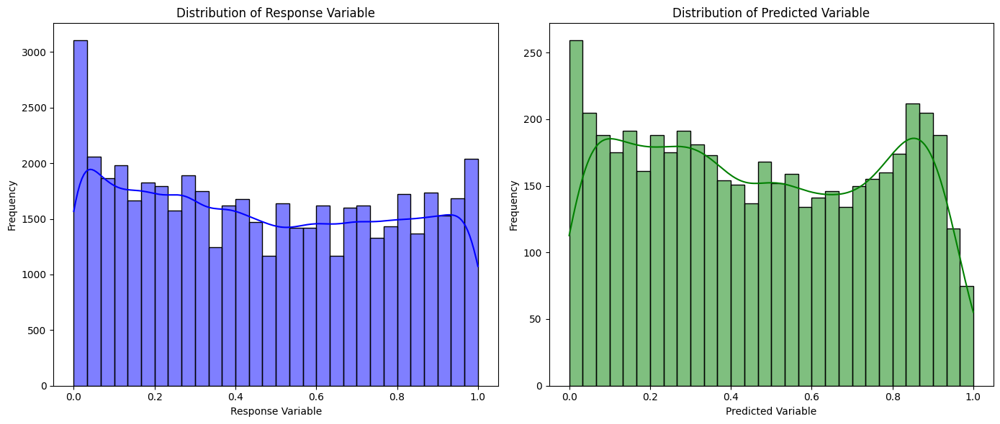

In [670]:
# Plotting
plt.figure(figsize=(14, 6))

# Plot for response variable
plt.subplot(1, 2, 1)
sns.histplot(y, kde=True, bins=30, color='blue')
plt.title('Distribution of Response Variable')
plt.xlabel('Response Variable')
plt.ylabel('Frequency')

# Plot for predicted variable
plt.subplot(1, 2, 2)
sns.histplot(predictions_df['Predicted'], kde=True, bins=30, color='green')
plt.title('Distribution of Predicted Variable')
plt.xlabel('Predicted Variable')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [675]:
pip install openpyxl > /dev/null


[notice] A new release of pip is available: 23.3.2 -> 24.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [677]:
predictions_df.to_csv('predictions.csv', index=False)

**Conclusions:**

In summary, the similarity between the statistics of the response variable and the predicted variable indicates that the model is capturing the data distribution well and generalizing effectively to the test set. The slight difference in the standard deviation is an observation to monitor, but it does not indicate a serious issue without further analysis.

# Explainability

After Grid Search, it’s crucial to ensure that any improvements in the model are genuine and not due to overfitting or other issues. SHAP and feature importance provide transparency by revealing how the model makes decisions, confirming that the refined model relies on relevant and actionable features. Additionally, these techniques enhance trust by making it easier to communicate and understand the reasons behind the model's predictions, which is important for stakeholders and decision-makers.

#### Feature Importance

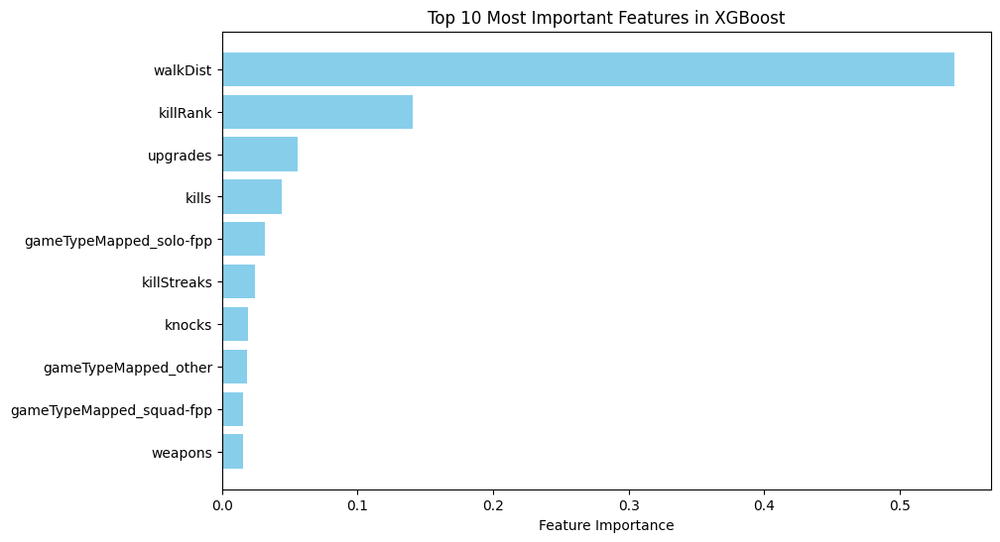

                     Feature  Importance
20                  walkDist    0.540209
12                  killRank    0.140752
7                   upgrades    0.055916
13                     kills    0.044288
3    gameTypeMapped_solo-fpp    0.031293
14               killStreaks    0.024372
9                     knocks    0.019379
1       gameTypeMapped_other    0.018326
5   gameTypeMapped_squad-fpp    0.015721
21                   weapons    0.015568
16                  gameTime    0.015485
4       gameTypeMapped_squad    0.015375
18                  rideDist    0.011461
0     gameTypeMapped_duo-fpp    0.009780
2        gameTypeMapped_solo    0.008419
15               highestKill    0.007317
6                    assists    0.006492
11                     heals    0.005431
8                    damages    0.004965
19                  swimDist    0.003515
17                   revives    0.003263
10                 headshots    0.002675


In [671]:
# Analyze feature importances
feature_importances = xgb_model.feature_importances_

# Create a DataFrame with features and their importances
features = X_val.columns  # Column names from the training DataFrame
importances_df = pd.DataFrame({'Feature': features, 'Importance': feature_importances})

# Sort features by importance
importances_df = importances_df.sort_values(by='Importance', ascending=False)

# Plot the top 10 most important features
plt.figure(figsize=(10, 6))
plt.barh(importances_df['Feature'][:10], importances_df['Importance'][:10], color='skyblue')
plt.xlabel('Feature Importance')
plt.title('Top 10 Most Important Features in XGBoost')
plt.gca().invert_yaxis()  # Invert the Y-axis to place the most important feature at the top
plt.show()

# Display feature importances
print(importances_df)

**Conclusions:**

- According to the Feature Importance, the most important variables for the model are `walkDist` and `killRank`, suggesting that the model relies heavily on these features to make predictions.

- Moderately Important Variables: `kills`, `upgrades`, and other game types have a relevant impact but are less significant compared to the most important variables.

- Low Importance Variables: Many of the remaining variables, such as `heals`, `damages`, and `vehicleDestr`, have a small impact on the predictions.

#### SHAP Values

In a SHAP (SHapley Additive exPlanations) plot:
- Thickness of the bars represents the importance of a feature.
- Width of the bars shows the range of the feature values.
- Colors indicate the direction of the feature’s impact on the prediction.

100%|===================| 9950/10000 [00:55<00:00]        

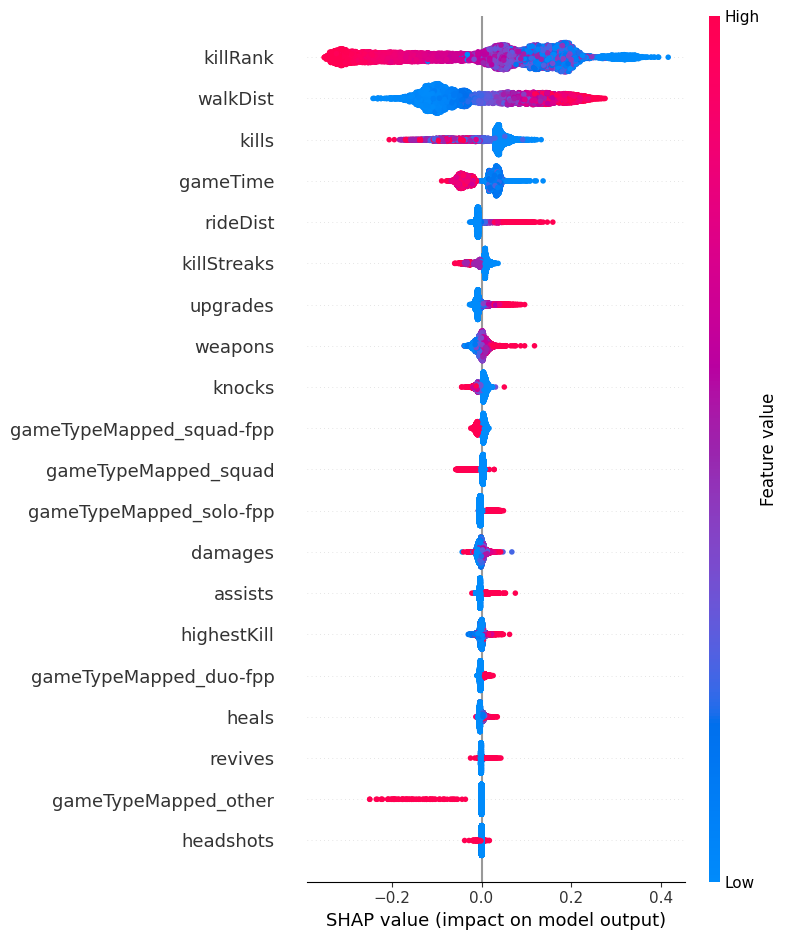

In [672]:
import shap

# Create an Explainer object for the fitted model
explainer = shap.Explainer(xgb_model, X_val)

# Compute SHAP values for the validation set
shap_values = explainer(X_val, check_additivity=False)

# Plot SHAP summary plot
shap.summary_plot(shap_values, X_val, show=False)

# Save the plot to a file for detailed analysis
import matplotlib.pyplot as plt
plt.savefig('shap_summary_plot.png')

**Conclusions:**

- According to the Shap Value, the most important variables  are  `killRank`, `walkDist` and `kills` , suggesting that the model relies heavily on these features to make predictions.

- The differences between the feature importance from XGBoost and the SHAP values arise because they measure different aspects of feature impact in a model. **XGBoost Feature Importance** provides a summary of which features are used more frequently or effectively in splits across the decision trees, while **SHAP Values** offer a detailed breakdown of how each feature contributes to individual predictions and overall feature importance. Both methods have their merits and can provide complementary insights, so combining them can offer a more comprehensive understanding of feature importance in my model.

It makes sense that variables like `walkDist`, `kills`, and `killRank` are important for predicting `winRankPercentage` for the following reasons:

- `kills`: The number of enemies killed (kills) is directly related to performance in competitive games. In many games, eliminating enemies is a clear indicator of skill and often correlates significantly with the player's final placement. Players who achieve more kills are generally more engaged in combat and may have a higher chance of reaching a better position.

- `killRank`: The kill ranking (killRank) reflects the number of enemies killed compared to other players in the same game. A higher kill rank indicates that the player is among the top in terms of kills, which is usually a good performance indicator and can strongly correlate with a higher final placement.

- `walkDist`: The distance traveled on foot (walkDist) can be important as it may reflect the amount of time a player spends exploring the map and interacting with the environment. In many games, strategic movement and map coverage are crucial for avoiding enemies and finding better equipment, which can directly impact the final placement.